# Lab 10.1 - AI Image Generation using GPUs and Diffusers

## Introduction

*Note*: This notebook is to be run in a Kaggle environment with a GPU:

1. Go to https://www.kaggle.com/code after creating a free account at kaggle.com
2. Go to File -> Import Notebook within the website and drag-and-drop this notebook file to upload it.
3. Go to Settings -> Turn on Internet if it is not already enabled

Later we will enable the GPU.

The purpose of this lab is to learn how to develop generative image models using the diffusers library and GPU acceleration, enabling creative and controllable visual synthesis from text and images. The diffusers library by Hugging Face runs and trains diffusion models (https://huggingface.co/docs/diffusers/en/index). 

Diffusion models are trained to denoise random Gaussian noise step-by-step to generate a sample of interest, such as an image or audio.

## Initial Exploration

Experiment with image prompting at sites such as https://deepai.org/, chatgpt/, http://gemini.google.com, https://x.com/i/grok

Examples of prompts can be found at https://lexica.art/, krea.ai and https://www.midjourney.com/explore

In this notebook images will be generated with different models, together with image-to-image transformations and interpolations.

## Setup

To enable the GPU go to Settings -> Accelerator -> GPU T4 x2. You have a limit of 30 hours of GPU use per month, so remember to turn off the GPU (Settings -> Accelerator -> None) when not needed.


In [2]:
# After running this cell you should see 
# '/device:GPU:0' (it's ok if additional messages appear)

import tensorflow as tf
tf.test.gpu_device_name()

I0000 00:00:1754803181.881194      36 gpu_device.cc:2022] Created device /device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1754803181.881432      36 gpu_device.cc:2022] Created device /device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


'/device:GPU:0'

The following cell installs the diffusers library (supported by the PyTorch 'torch' deep learning framework) and the transformers library. The transformers library (also by Hugging Face) makes it easy to use modern AI models without having to build them from scratch.

In [ ]:
!pip install diffusers["torch"] transformers

The `DiffusionPipeline` class allows one to generate images with a simple interface - all the model components are automatically loaded.

In [3]:
import torch
from diffusers import DiffusionPipeline

In [4]:
# Releases cached unused memory for reuse by PyTorch
torch.cuda.empty_cache()

## Unprompted image generation

To begin with, we generate images from a pretrained model that was trained on butterfly images. Unprompted images can be used to evaluate image quality, diversity, and realism without prompt bias. It helps visualise the range of possibilities that the model has learned.

In [7]:
import platform, socket, subprocess, torch

print("Python:", platform.python_version())
print("Torch:", torch.__version__)
print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

def can_resolve(host="huggingface.co"):
    try:
        socket.gethostbyname(host); return True
    except Exception:
        return False

print("DNS huggingface.co:", "OK" if can_resolve() else "SIN INTERNET (DNS falla)")

try:
    out = subprocess.check_output(["ping","-c","1","huggingface.co"], stderr=subprocess.STDOUT)
    print("Ping a huggingface.co: OK")
except Exception:
    print("Ping a huggingface.co: no disponible (posible Internet OFF)")


Python: 3.11.13
Torch: 2.6.0+cu124
CUDA disponible: True
GPU: Tesla T4
DNS huggingface.co: SIN INTERNET (DNS falla)
Ping a huggingface.co: no disponible (posible Internet OFF)


In [9]:
# Usa las librerías ya instaladas en la imagen de Kaggle (más rápido)
from diffusers import DDPMPipeline, DiffusionPipeline
from PIL import Image
import torch, os
print("Diffusers imported.")


Diffusers imported.


model_index.json:   0%|          | 0.00/181 [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/455M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/289 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/852 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

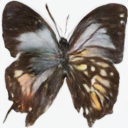

In [12]:
# If the kernel dies, simply rerun the previous two code cells and this cell
# The .to("cuda") method in PyTorch moves a model or tensor from the CPU to the GPU.
generator = DiffusionPipeline.from_pretrained("anton-l/ddpm-butterflies-128").to("cuda")

image = generator().images[0]
image

Rerun the code below to see a new image is generated from a different random sample of noise

  0%|          | 0/1000 [00:00<?, ?it/s]

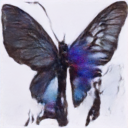

In [13]:
image = generator().images[0]
image

### Changing the number of inference steps

Set num_inference_steps to 1, 2, 3 to see the image at early stages of generation.

  0%|          | 0/1 [00:00<?, ?it/s]

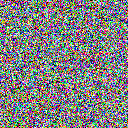

In [14]:
# 1 step
image = generator(num_inference_steps=1).images[0]
image

  0%|          | 0/2 [00:00<?, ?it/s]

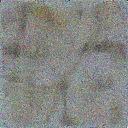

In [15]:
# 2 steps
# ANSWER:
image = generator(num_inference_steps=2).images[0]
image

  0%|          | 0/3 [00:00<?, ?it/s]

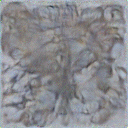

In [16]:
# 3 steps
# ANSWER:
image = generator(num_inference_steps=3).images[0]
image

**Exercise**: Use the larger "google/ddpm-celebahq-256" model instead of "anton-l/ddpm-butterflies-128" with 100 inference steps to generate a realistic face.

model_index.json:   0%|          | 0.00/180 [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/790 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/100 [00:00<?, ?it/s]

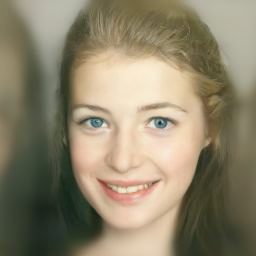

In [17]:
# ANSWER
generator = DiffusionPipeline.from_pretrained("google/ddpm-celebahq-256").to("cuda")
image = generator(num_inference_steps=100).images[0]
image

## Prompted image generation

Next we observe the impact of a detailed prompt using the popular Stable Diffusion model.

In [18]:
model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"

pipeline = DiffusionPipeline.from_pretrained(model_id, use_safetensors=True)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [19]:
prompt = "a panda playing guitar in a bamboo forest, cartoon style, soft lighting, in a playful mood"
# feel free to change this

In [20]:
pipeline = pipeline.to("cuda")

In [21]:
generator = torch.Generator("cuda").manual_seed(0)

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 28.9 s, sys: 178 ms, total: 29.1 s
Wall time: 29.4 s


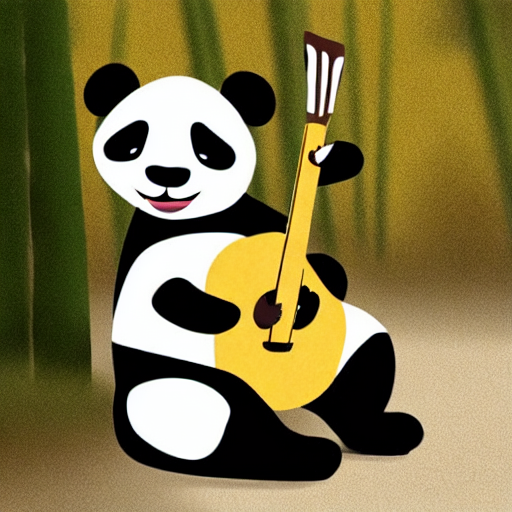

In [22]:
%%time
image = pipeline(prompt, generator=generator).images[0]
image #note that 50 is now the default number of inference steps

We can make this run faster on GPUs by setting torch_dtype to torch.float16 (the default is 32-bit precision).

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 9.54 µs


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

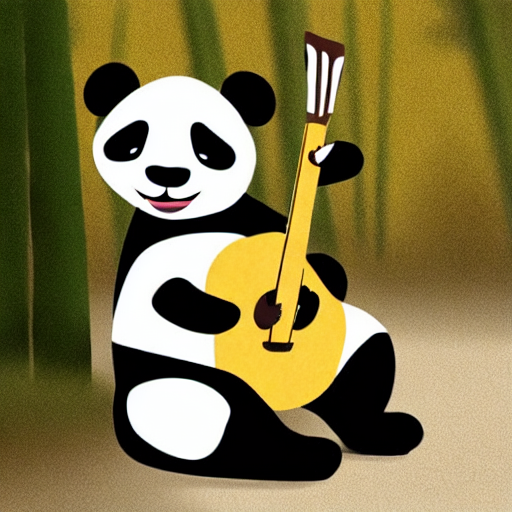

In [23]:
%time
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, use_safetensors=True)
pipeline = pipeline.to("cuda")
generator = torch.Generator("cuda").manual_seed(0)

image = pipeline(prompt, generator=generator).images[0]
image

The following code enables a grid of sample images to be generated.

In [24]:
def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

In [25]:
from diffusers.utils import make_image_grid

In [26]:
pipeline.enable_attention_slicing() #breaks large attention computations into smaller chunks

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 29.2 s, sys: 9.48 s, total: 38.7 s
Wall time: 38.8 s


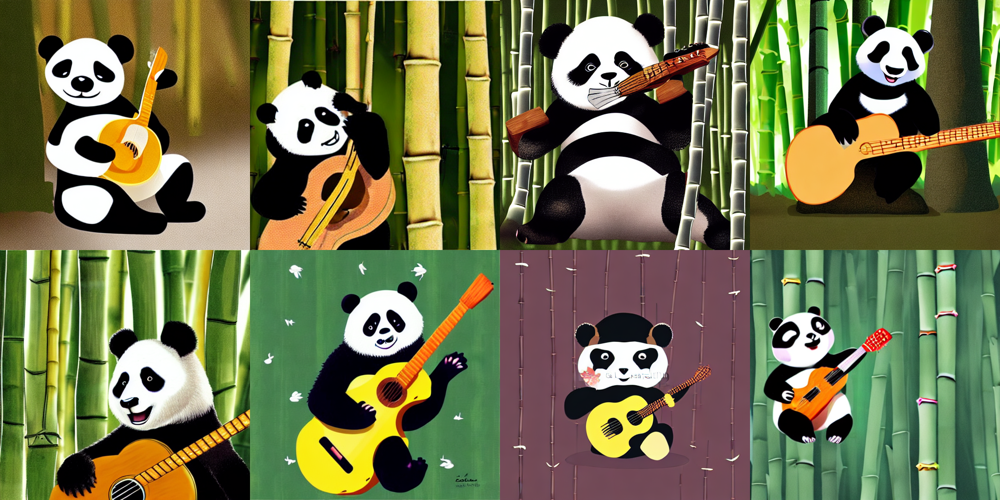

In [27]:
%%time
images = pipeline(**get_inputs(batch_size=8)).images
make_image_grid(images, rows=2, cols=4)

We now try a more advanced model:

In [28]:
pipe_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = DiffusionPipeline.from_pretrained(pipe_id, torch_dtype=torch.float16)
pipe.to("cuda");
# it may take a couple of minutes for everything (~15GB) to be downloaded to Kaggle

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.safetens(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

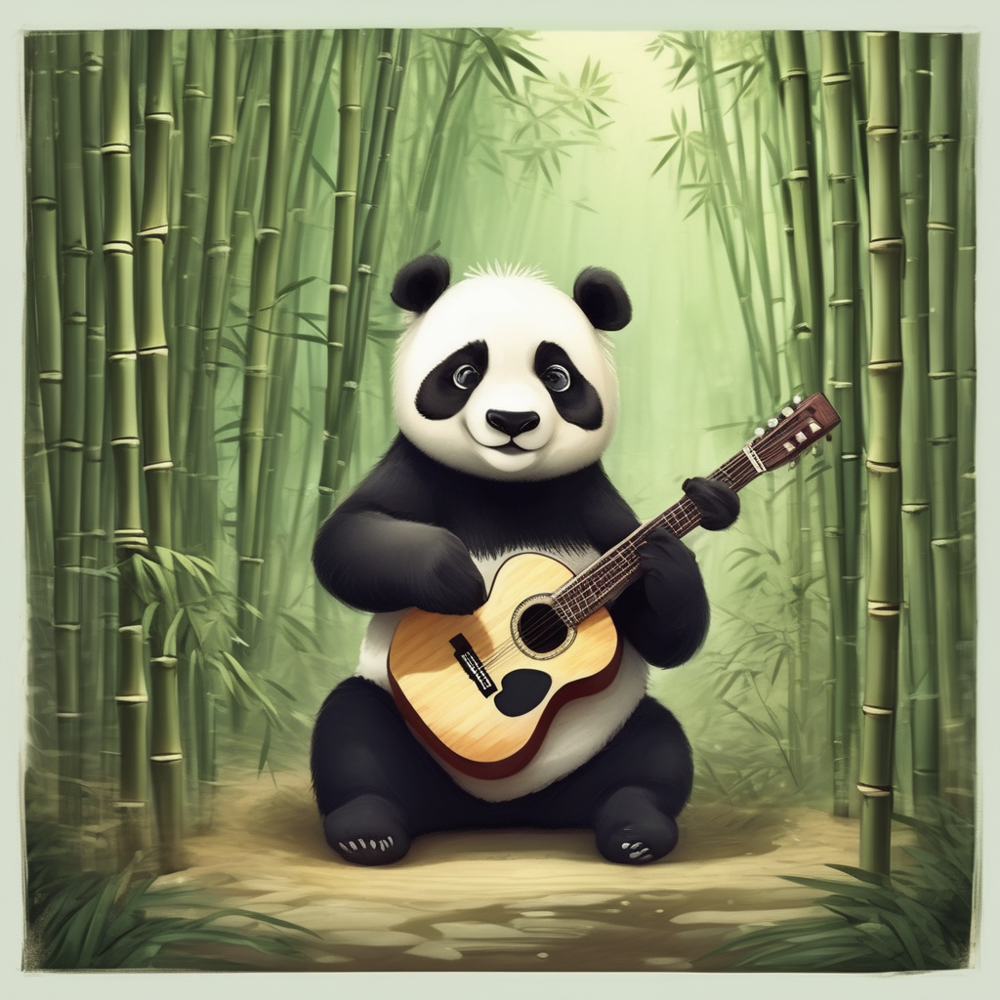

In [29]:
#prompt = "a cartoon of a 1980s car on a desert highway, midday sun"
 
image = pipe(prompt).images[0]
 
image

**Exercise**: Using the same pipe create two images - one with a less sophisticated and one with a more detailed prompt.

  0%|          | 0/50 [00:00<?, ?it/s]

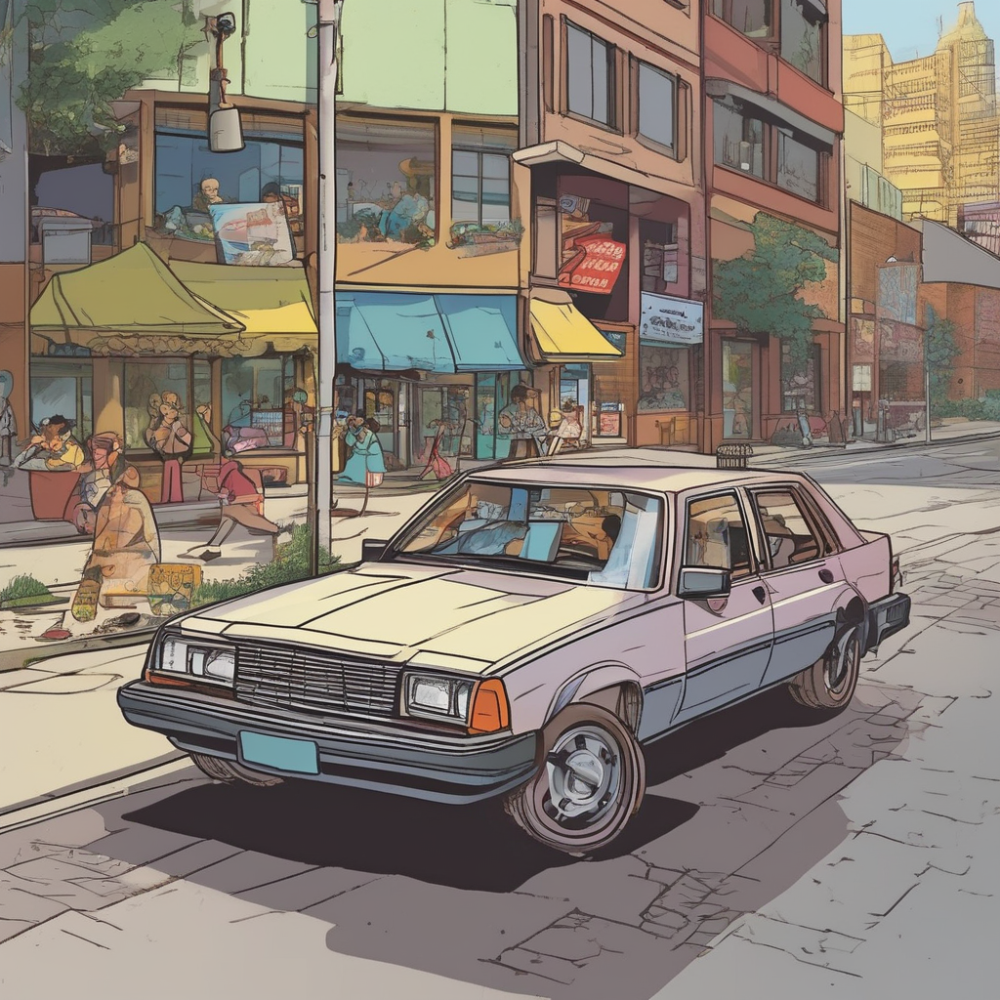

In [30]:
# ANSWER
easy_prompt = "a cartoon of a 1980s car"

image = pipe(easy_prompt).images[0]

image


  0%|          | 0/50 [00:00<?, ?it/s]

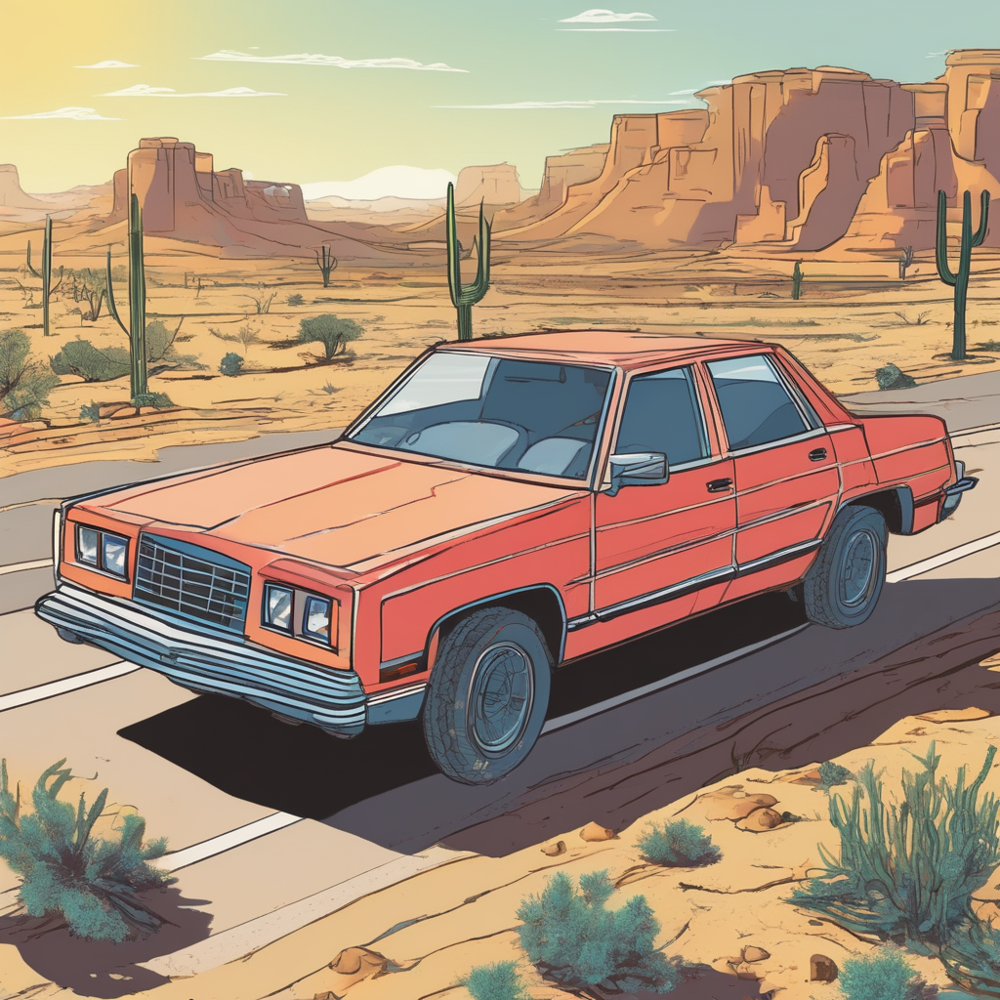

In [31]:
# ANSWER
detailed_prompt = "a cartoon of a 1980s car on a desert highway, midday sun"
#negative_prompt = "poor quality, bad quality"

image = pipe(detailed_prompt).images[0] #, negative_prompt = negative_prompt).images[0]

image


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

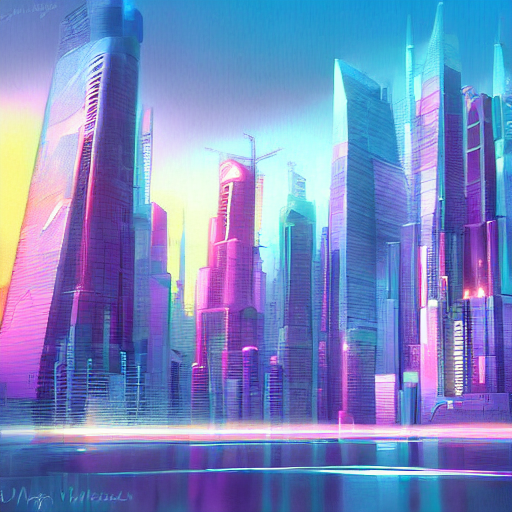

In [32]:
pipe = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipe = pipe.to("cuda")


prompt = "A futuristic cityscape at sunset, digital art"
image = pipe(prompt).images[0]
image

## Image to image

In this section we take an existing image and edit it using prompting.

In [33]:
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import load_image

In [34]:
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16, use_safetensors=True
)
pipeline.enable_model_cpu_offload()
# enables offloading of model weights from the GPU to the CPU when the GPU memory is insufficient 
# for the entire model.

# ~13GB is downloaded here



model_index.json:   0%|          | 0.00/250 [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

movq/diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/317 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

prior/diffusion_pytorch_model.safetensor(…):   0%|          | 0.00/4.10G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

image_encoder/model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [35]:

init_image = load_image('https://plus.unsplash.com/premium_photo-1674917000586-b7564f21540e').resize((512, 512))


  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/kandinsky2_2/pipeline_kandinsky2_2_img2img.py:269: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider use `callback_on_step_end`
  deprecate(


  0%|          | 0/5 [00:00<?, ?it/s]

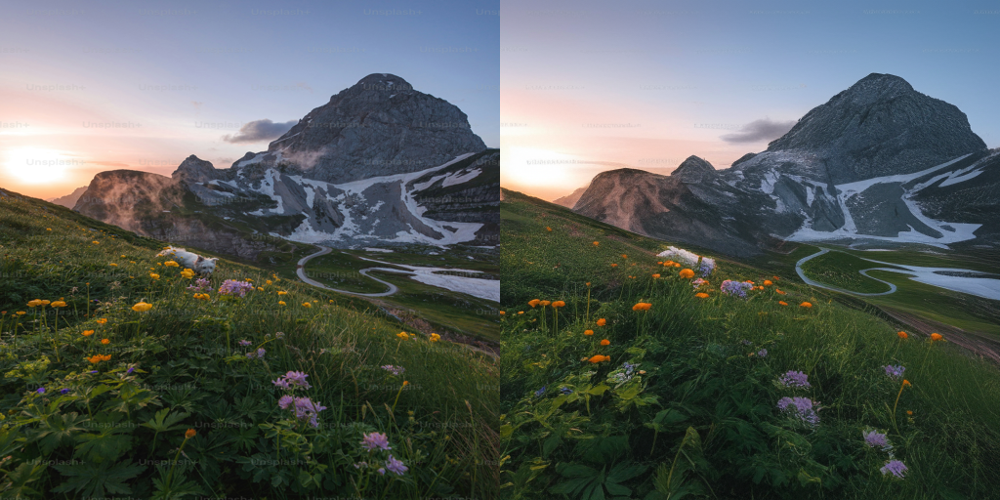

In [36]:
prompt = "make this look like a painting"
image = pipeline(prompt, image=init_image, strength = 0.05, guidance_scale=1.0).images[0] 
# higher guidance scale - closer to prompt (default = 7.5)
# higher strength - more creativity (default = 0.8)
make_image_grid([init_image, image], rows=1, cols=2)

**Exercise**: investigate what happens when the guidance scale and strength are changed.

## Image interpolation

Finally we see how we can interpolate images based on two distinct prompts. Feel free to change the prompts below.

In [37]:
import numpy as np
from PIL import Image

# Load Stable Diffusion pipeline
pipe = DiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")

pipe.enable_attention_slicing()

# Two text prompts
prompt1 = "a futuristic city at sunset"
prompt2 = "a medieval village in winter"

# Get text embeddings
text_input1 = pipe.tokenizer(prompt1, return_tensors="pt").input_ids.to("cuda")
text_input2 = pipe.tokenizer(prompt2, return_tensors="pt").input_ids.to("cuda")

embeds1 = pipe.text_encoder(text_input1)[0]
embeds2 = pipe.text_encoder(text_input2)[0]

# Interpolate between embeddings
steps = 10
interpolated_images = []

for alpha in np.linspace(0, 1, steps):
    blended_embed = (1 - alpha) * embeds1 + alpha * embeds2
    image = pipe(prompt_embeds=blended_embed).images[0]
    interpolated_images.append(image)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Observe the similarity of the prompts via cosine similarity:

In [38]:
from torch.nn.functional import cosine_similarity
similarity = cosine_similarity(embeds1, embeds2).mean()
print(f"Cosine similarity: {similarity.item():.4f}")

Cosine similarity: 0.3762


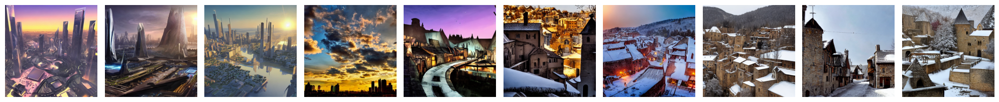

In [39]:
import matplotlib.pyplot as plt

# Display results
fig, axs = plt.subplots(1, steps, figsize=(20, 4))
for i, img in enumerate(interpolated_images):
    axs[i].imshow(img)
    axs[i].axis("off")
plt.tight_layout()
plt.show()

We can save this as an image or video file for download:

In [40]:
import imageio
gif_path = "interpolated_images.gif"
imageio.mimsave(gif_path, interpolated_images, fps=4)
#download the image after finding the file under the /kaggle/working folder in the Output section in the sidebar.


In [41]:
imageio.mimsave("video.mp4", interpolated_images, fps=4)

## BONUS

Experiment with other models at https://huggingface.co/models using the image-related filters.

## Summary

We have learnt how to enable GPUs in Kaggle and use the diffusers library for image generation of diffusion models with different models and settings. We used unprompted and prompted image generation, then looked at the tasks of image-to-image changes via prompting as well as image interpolation.

Turn off GPU usage by going to Settings -> Accelerator -> None in Kaggle. Under "Session options" on the right side panel you will be able to see how much of your 30-hour quota has been used up.

Save and download this file for submission.

## References

https://huggingface.co/docs/diffusers/en/index

https://huggingface.co/docs/diffusers/main/using-diffusers/write_own_pipeline